(hsgp)=
# Gaussian Processes: `pm.gp.HSGP` Reference and Example Usage

:::{post} March 11, 2024
:tags: gaussian processes
:category: reference, intermediate
:author: Bill Engels
:::

The Hilbert Space Gaussian processes approximation is a low-rank GP approximation that is particularly well-suited to usage in probabilistic programming languages like PyMC.  It approximates the GP using a pre-computed and fixed set of basis functions that don't depend on the form of the covariance kernel or its hyperparameters.  It's a _parametric_ approximation, so prediction in PyMC can be done as one would with a linear model via `pm.MutableData` or `pm.set_data`.  You don't need to define the `.conditional` distribution that non-parameteric GPs rely on.  This makes it _much_ easier to integrate an HSGP, instead of a GP, into your existing PyMC model.  Additionally, unlike many other GP approximations, HSGPs can be used anywhere within a model and with any likelihood function.  

It's also fast.  The computational cost for unapproximated GPs per MCMC step is $\mathcal{O}(n^3)$, where $n$ is the number of data points.  For HSGPs, it is $\mathcal{O}(mn + m)$, where $m$ is the number of basis vectors.  It's important to note that _sampling speeds_ are also very strongly determined by posterior geometry. 

The HSGP approximation does carry some restrictions:
1. It can only be used with _stationary_ covariance kernels such as the Matern family.  The `HSGP` class is compatible with any `Covariance` class that implements the `power_spectral_density` method.  There is a special case made for the `Periodic` covariance, which is implemented in PyMC by `HSGPPeriodic`. 
2. It does not scale well with the input dimension.  The HSGP approximation is a good choice if your GP is over a one dimensional process like a time series, or a two dimensional spatial point process.  It's likely not an efficient choice where the input dimension is larger than three. 
3. It _may_ struggle with more rapidly varying processes.  If the process you're trying to model changes very quickly relative to the extent of the domain, the HSGP approximation may fail to accurately represent it.  We'll show in later sections how to set the accuracy of the approximation, which involves a trade-off between the fidelity of the approximation and the computational complexity.
4. For smaller data sets, the full unapproximated GP may still be more efficient.

A secondary goal of this implementation is flexibility via an accessible implementation where the core computations are implemented in a modular way.  For basic usage, users can use the `.prior` and `.conditional` methods and essentially treat the HSGP class as a drop in replacement for `pm.gp.Latent`, the unapproximated GP.  More advanced users can bypass those methods and work with `.prior_linearized` instead, which exposes the HSGP as a parametric model.  For more complex models with multiple HSGPs, users can work directly with functions like `pm.gp.hsgp_approx.calc_eigenvalues` and `pm.gp.hsgp_approx.calc_eigenvectors`.

#### References:
- Original reference: [Solin & Sarkka, 2019](https://link.springer.com/article/10.1007/s11222-019-09886-w).
- HSGPs in probabilistic programming languages: [Riutort-Mayol et al., 2020](https://arxiv.org/abs/2004.11408).
- HSTPs (Student-t process): [Sellier & Dellaportas, 2023](https://proceedings.mlr.press/v202/sellier23a.html).
- Kronecker HSGPs: [Dan et al., 2022](https://arxiv.org/pdf/2210.11358.pdf)

# Example 1: Basic HSGP Usage

We'll use simulated data to motivate an overview of the usage of `pm.gp.HSGP`.  Refer to this section if you're interested in:
1. Seeing a simple example of `HSGP` in action.
2. Replacing a standard GP, i.e. `pm.gp.Latent`, with a faster approximation -- as long as you're using one of the more common covariance kernels, like `ExpQuad`, `Matern52` or `Matern32`.
3. Understanding when to use the centered or the non-centered parameterization.
4. A quick example of additive GPs

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pymc as pm
import pytensor.tensor as pt

In [2]:
az.style.use("arviz-whitegrid")
plt.rcParams["figure.figsize"] = [12, 5]
%config InlineBackend.figure_format = 'retina'
seed = sum(map(ord, "hsgp"))
rng = np.random.default_rng(seed)

### Simulate data

In [3]:
def simulate_1d(x, ell_true, eta_true, sigma_true):
    """Given a domain x, the true values of the lengthscale ell, the
    scale eta, and the noise sigma, simulate a one-dimensional GP
    observed at the given x-locations.
    """

    # Draw one sample from the underlying GP.
    n = len(x)
    cov_func = eta_true**2 * pm.gp.cov.Matern52(1, ell_true)
    gp_true = pm.MvNormal.dist(mu=np.zeros(n), cov=cov_func(x[:, None]))
    f_true = pm.draw(gp_true, draws=1, random_seed=rng)

    # The observed data is the latent function plus a small amount
    # of Gaussian distributed noise.
    noise_dist = pm.Normal.dist(mu=0.0, sigma=sigma_true)
    y_obs = f_true + pm.draw(noise_dist, draws=n, random_seed=rng)
    return y_obs, f_true

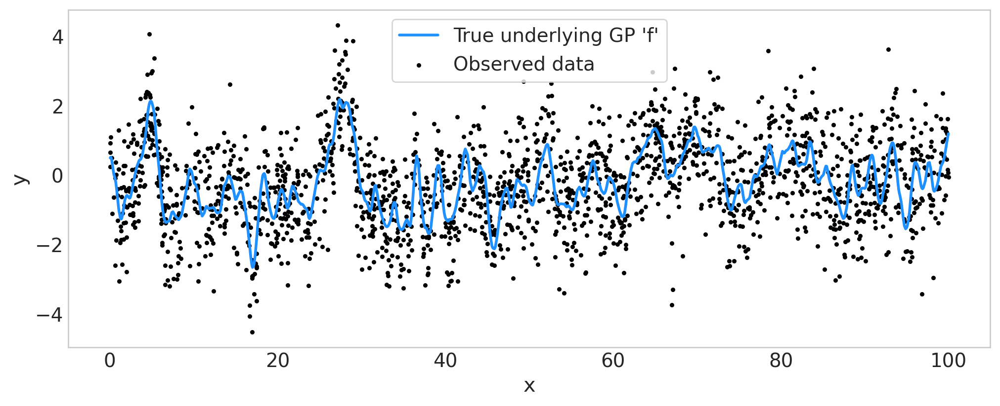

In [4]:
fig = plt.figure(figsize=(10, 4))
ax = fig.gca()

x = 100.0 * np.sort(np.random.rand(2000))
y_obs, f_true = simulate_1d(x=x, ell_true=1.0, eta_true=1.0, sigma_true=1.0)
ax.plot(x, f_true, color="dodgerblue", lw=2, label="True underlying GP 'f'")
ax.scatter(x, y_obs, marker="o", color="black", s=5, label="Observed data")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.legend(frameon=True)
ax.grid(False)

### Define and fit the HSGP model

First we use `pm.find_constrained_prior` to choose our prior for the lengthscale parameter.  We use a Lognormal to penalize very small lengthscales while having a heavy right tail.  When the signal from the GP is high relative to the noise, we are able to use more informative priors.  The following 

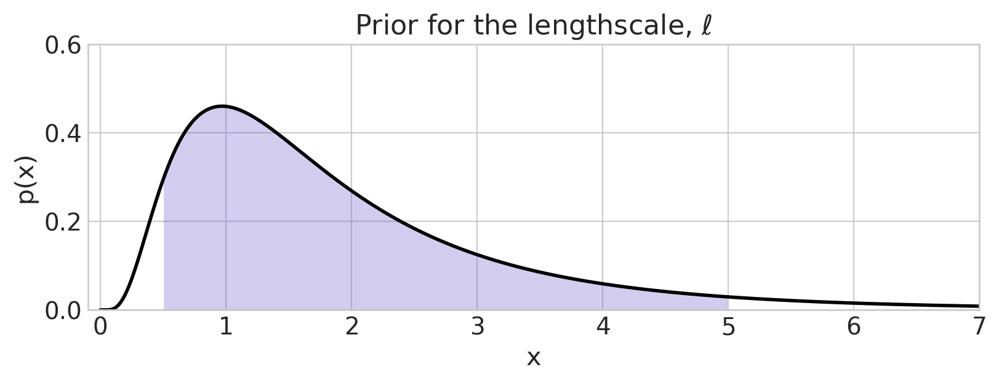

In [5]:
ell_dist = pm.Lognormal

lower, upper = 0.5, 5.0
ell_params = pm.find_constrained_prior(
    ell_dist, lower=lower, upper=upper, mass=0.9, init_guess={"mu": 1.0, "sigma": 1.0}
)

support = np.linspace(0, 7.0, 1000)
logp = pm.logp(ell_dist.dist(**ell_params), support)
p = np.exp(logp.eval())

plt.figure(figsize=(8, 3))

bulk_ix = (support >= lower) & (support <= upper)
plt.fill_between(
    support[bulk_ix],
    np.zeros(sum(bulk_ix)),
    p[bulk_ix],
    color="slateblue",
    alpha=0.3,
    edgecolor="none",
)
plt.plot(support, p, color="k", lw=2)

plt.xlabel("x")
plt.ylabel("p(x)")
plt.xlim([-0.1, 7.0])
plt.ylim([0.0, 0.6])
plt.title(r"Prior for the lengthscale, $\ell$");

There are a few things to note about the model code below:
- The approximation parameters `m` and `c` control the approximation fidelity to computational complexity tradeoff.  We'll see in a later section how to choose these values.  In short, choosing a larger `m` helps improve the approximation of smaller lengthscales and other short distance variations that the GP has to fit.  Choosing a larger `c` helps improve the approximation of longer and slower changes. 
- We chose the `centered` parameterization because the true underlying GP is strongly informed by the data.  You can read more about centered vs. non-centered [here](https://twiecki.io/blog/2017/02/08/bayesian-hierchical-non-centered/) and [here](https://arxiv.org/abs/1312.0906).  In the `HSGP` class, the default is `non-centered`, which works better for the, arguably more common, case where the underlying GP is weakly informed by the observed data.

In [6]:
with pm.Model() as model:
    ell = ell_dist("ell", **ell_params)
    eta = pm.Exponential("eta", scale=1.0)
    cov_func = eta**2 * pm.gp.cov.Matern52(input_dim=1, ls=ell)

    # m and c control the fidelity of the approximation
    m, c = 200, 1.5
    parameterization = "centered"
    gp = pm.gp.HSGP(m=[m], c=c, parameterization=parameterization, cov_func=cov_func)
    # Compare to the code for the full, unapproximated GP:
    # gp = pm.gp.Latent(cov_func=cov_func)
    f = gp.prior("f", X=x[:, None])

    sigma = pm.Exponential("sigma", scale=1.0)
    pm.Normal("y_obs", mu=f, sigma=sigma, observed=y_obs)

    idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ell, eta, f_hsgp_coeffs_, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 17 seconds.


In [7]:
az.summary(idata, var_names=["eta", "ell", "sigma"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
eta,0.832,0.077,0.688,0.969,0.001,0.001,3833.0,3577.0,1.0
ell,1.035,0.119,0.816,1.267,0.004,0.003,955.0,1512.0,1.0
sigma,1.009,0.017,0.979,1.040,0.000,0.000,7964.0,2629.0,1.0


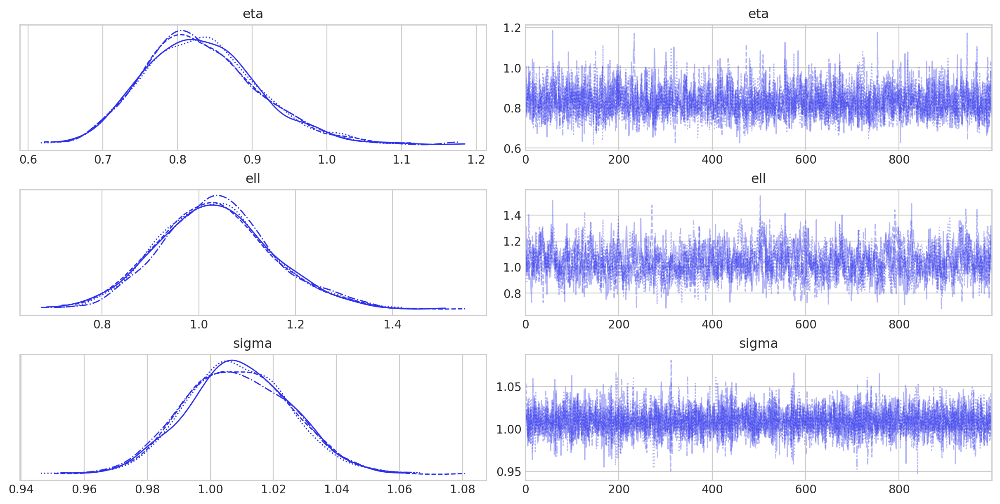

In [8]:
az.plot_trace(idata, var_names=["eta", "ell", "sigma"]);

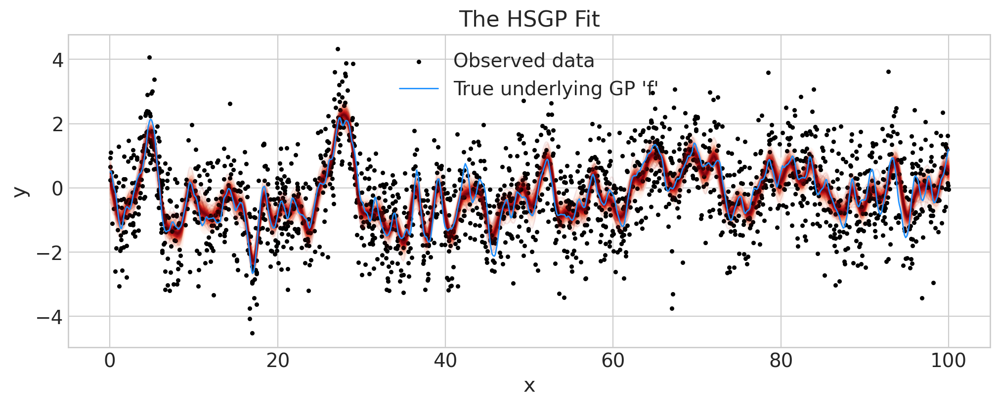

In [9]:
fig = plt.figure(figsize=(10, 4))
ax = fig.gca()

f = az.extract(idata, var_names="f")
pm.gp.util.plot_gp_dist(ax=ax, samples=f.T, x=x)

ax.scatter(x, y_obs, marker="o", color="black", s=5, label="Observed data")
ax.plot(x, f_true, color="dodgerblue", lw=1, label="True underlying GP 'f'")
ax.set(title="The HSGP Fit", xlabel="x", ylabel="y")
ax.legend();

The inferred underlying GP (shaded in red) accurately matches the true underlying GP (in light blue).

### Additive GPs

The `pm.gp.HSGP` class is compatible with additive covariances, instead of defining two completely independent HSGPs.  Additive processes result in a product of the power spectral densities.  This can help reduce the number of unknown parameters, because the two GPs can share the same basis set.  The code for this would look similar to:

```python
cov1 = eta1**2 * pm.gp.cov.ExpQuad(input_dim, ls=ell1)
cov2 = eta2**2 * pm.gp.cov.Matern32(input_dim, ls=ell2)
cov = cov1 + cov2

gp = pm.gp.HSGP(m=[m], c=c, cov_func=cov_func)
```

# Choosing the HSGP approximation parameters, `m`, `L`, and `c`

Before fitting a model with an HSGP, you have to choose `m` and `c` or `L`.  `m` is the number of basis vectors.  Recall that the computational complexity of the HSGP approximation is $\mathcal{O}(mn + m)$, where $n$ is the number of data points. 

This choice is a balance between three concerns:
1.  The accuracy of the approximation.
2.  Reducing the computational burden.
3.  The `X` locations where predictions or forecasts will need to be made.

At the end of this section, we'll give the rules of thumb given in [Paper].  The best way to understand how to choose these parameters is to understand how `m`, `c` and `L` relate to each other, which requires understanding a bit more about how the approximation works under the hood.  

### How `L` and `c` affect the basis

Speaking non-technically, the HSGP approximates the GP prior as a linear combination of sinusoids.  The coefficients of the linear combination are IID normal random variables whose standard deviation depends on GP hyperparameters (which are an amplitude and lengthscale for the Matern family). 

To see this, we'll make a few plots of the $m=3$ basis vectors and pay careful attention to how they behave at the boundaries of the domain.  Note that we have to center the `x` data first, and then choose `L` in relation to the centered data.  It's worth mentioning here that the basis vectors we're plotting do not depend on either the choice of the covariance kernel or on any unknown parameters the covariance function has.    

/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_1656/1508176518.py:6: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=0.02)


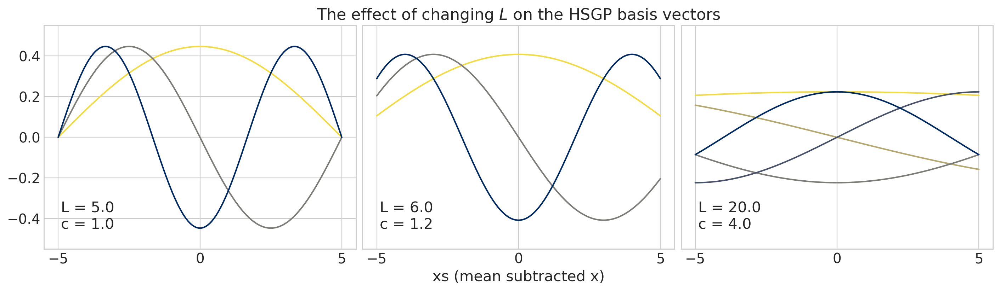

In [10]:
# Our data goes from x=-5 to x=5
x = np.linspace(-5, 5, 1000)

# (plotting code)
fig, axs = plt.subplots(1, 3, figsize=(14, 4))
plt.subplots_adjust(wspace=0.02)
ylim = 0.55
axs[0].set_ylim([-ylim, ylim])
axs[1].set_yticks([])
axs[1].set_ylim([-ylim, ylim])
axs[1].set_xlabel("xs (mean subtracted x)")
axs[1].set_title("The effect of changing $L$ on the HSGP basis vectors")
axs[2].set_yticks([])
axs[2].set_ylim([-ylim, ylim])

# change L as we create the basis vectors
L_options = [5.0, 6.0, 20.0]
m_options = [3, 3, 5]
for i, ax in enumerate(axs.flatten()):
    L = L_options[i]
    m = m_options[i]

    eigvals = pm.gp.hsgp_approx.calc_eigenvalues(pt.as_tensor([L]), [m], tl=pt)
    phi = pm.gp.hsgp_approx.calc_eigenvectors(
        x[:, None], pt.as_tensor([L]), eigvals, [m], tl=pt
    ).eval()

    colors = plt.cm.cividis_r(np.linspace(0.05, 0.95, m))
    for j in range(phi.shape[1]):
        ax.plot(x, phi[:, j], color=colors[j])

    ax.set_xticks(np.arange(-5, 6, 5))

    S = 5.0
    c = L / S
    ax.text(-4.9, -0.45, f"L = {L}\nc = {c}", fontsize=15)

Notice that both `L` and `m` are specified as lists, to allow setting `L` and `m` per input dimension.  In this example these are both one element lists since our example is in a one dimensional, time series like context.  Before continuing, it's helpful to define $S$ as the half range of the centered data, or the distance from the midpoint at $x=0$ to the edge, $x=5$.  In this example $S=5$ for each plot panel.  Then, we can define $c$ such that it relates $S$ to $L$, 
$$
L = c \cdot S \,.
$$
It's usually easier to set $L$ by choosing $c$, which acts as a multiplier on $S$.  

In the left-most plot we chose $L=S=5$, which is exactly on the edge of our `x` locations.  For any $m$, all the basis vectors are forced to pinch to zero at the edges, at $x=-5$ and $x=5$.  This means that the HSGP approximation becomes poor as you get closer to $x=-5$ and $x=5$.  How quickly depends on the lengthscale.  Large lengthscales require larger values of $L$ and $c$, and smaller lengthscales attenuate this issue.  Ruitort-Mayol et. al. recommend using 1.2 as a minimum value.  The effect of this choice on the basis vectors is shown in the center panel. In particular, we can now see that the basis vectors are _not_ forced to pinch to zero.

The right panel shows the effect of choosing a larger $L$, or setting $c=4$.  Larger values of $L$ or $c$ make the boundary conditions less problematic, and are required to accurately approximate GPs with longer lengthscales. **You also need to consider where predictions will need to be made**.  In addition to the locations of the observed $x$ values, the locations of the new $x$ locations also need to be away from the "pinch" caused by the boundary condition.  The _period_ of the basis functions also increases as we increase $L$ or $c$.  This means that **we will need to increase $m$ in order to compensate** if we wish to approximate GPs with smaller lengthscales.  

With large $L$ or $c$, the first eigenvector can flatten so much that it becomes partially or completely unidentifiable with the intercept in the model.  The right-most panel is an example of this (see the yellow eigenvector).  It can be very beneficial to sampling to drop the first eigenvector in these situations.  The `HSGP` and `HSGPPeriodic` class in PyMC both have the option `drop_first` to do this, or if you're using `.prior_linearized` you can control this yourself.  **Be sure to check the basis vectors if the sampler is having issues**.

To summarize:

- **Increasing $m$ helps the HSGP approximate GPs with smaller lengthscales**, at the cost of increasing computational complexity.
- **Increasing $c$ or $L$ helps the HSGP approximate GPs with larger lengthscales**, but may require increasing $m$ to compensate for the loss of fidelity at smaller lengthscales.  
- When choosing $m$, $c$ or $L$, it's important to **consider the locations where you will need to make predictions**, such that they also aren't affected by the boundary condition.
- **The first eigenvector in the basis may be unidentified** with the intercept, especially when $L$ or $c$ are larger.


### Heuristics for choosing $m$ and $c$

In practice, you'll need to infer the lengthscale from the data, so the HSGP needs to approximate a GP across a range of lengthscales that are representative of your chosen prior. You'll need to choose **$c$ large enough to handle the largest lengthscales** you might fit, and also **choose $m$ large enough to accommodate the smallest lengthscales**.

[Ruitort-Mayol et. al.] give some handy heuristics for the range of lengthscales that are accurately reproduced for given values of $m$ and $c$.  Below, we provide a function that uses their heuristics to recommend minimum $m$ and $c$ value.  Note that these recommendations are based on a one-dimensional GP.

For example, if you're using the `Matern52` covariance and your data ranges from $x=-5$ to $x=95$, and the bulk of your lengthscale prior is between $\ell=1$ and $\ell=50$, then the smallest recommended values are $m=280$ and $c=3.2$.

In [3]:
def approx_params(x_lower, x_upper, ell_lower, ell_upper, cov_func="matern52"):
    if (x_lower >= x_upper) or (ell_lower >= ell_upper):
        raise ValueError("One of the boundaries out of order")

    S = (x_upper - x_lower) / 2

    if cov_func.lower() == "expquad":
        a1, a2 = 3.2, 1.75

    elif cov_func.lower() == "matern52":
        a1, a2 = 4.1, 2.65

    elif cov_func.lower() == "matern32":
        a1, a2 = 4.5, 3.42

    c = max(a1 * (ell_upper / S), 1.2)
    m = int(a2 * c / (ell_lower / S))

    return m, c, S


m, c, _ = approx_params(x_lower=-5, x_upper=95, ell_lower=1, ell_upper=50, cov_func="expquad")

print(f"Smallest m: {m}")
print(f"Smallest c: {c:.1f}")

Smallest m: 280
Smallest c: 3.2


### The HSGP approximate Gram matrix

You may not be able to rely on these heuristics for a few reasons.  You may be using a different covariance function than `ExpQuad`, `Matern52`, or `Matern32`.  Also, they're only defined for one dimensional GPs.  Another way to check HSGP fidelity is to directly compare the unapproximated Gram matrix (the Gram matrix is the matrix obtained after calculating the covariance function over the inputs `X`), $\mathbf{K}$, to the one resulting from the HSGP approximation, 
$$
\tilde{\mathbf{K}} = \Phi \Delta \Phi^T \,,
$$
where $\Phi$ is the matrix of eigenvectors we use as the basis (plotted previously), and $\Delta$ has the spectral densities computed at the eigenvalues down the diagonal.  Below we show an example with a two dimensional grid of input `X`.  It's important to notice that the HSGP approximation requires us to center the input `X` data, which is done by converting `X` to `Xs` in the code below.  We plot the approximate Gram matrix for varying $L$ and $c$ values, to see when the approximation starts to degrade for the given `X` locations and lengthscale choices.

In [12]:
## Define the X locations and calculate the Gram matrix from a given covariance function
x1, x2 = np.meshgrid(np.linspace(0, 10, 50), np.linspace(0, 10, 4))
X = np.vstack((x2.flatten(), x1.flatten())).T

# X is two dimensional, so we set input_dim=2
chosen_ell = 3.0
cov_func = pm.gp.cov.ExpQuad(input_dim=2, ls=chosen_ell)
K = cov_func(X).eval()

## Calculate the HSGP approximate Gram matrix
# Center or "scale" X so we can work with Xs (important)
Xs = X - np.mean(X, axis=0)

# Calculate L given Xs and c
m, c = [20, 20], 2.0
L = pm.gp.hsgp_approx.set_boundary(Xs, c).eval()


def calculate_Kapprox(Xs, L, m):
    # Calculate Phi and the diagonal matrix of power spectral densities
    eigvals = pm.gp.hsgp_approx.calc_eigenvalues(L, m, tl=pt)
    phi = pm.gp.hsgp_approx.calc_eigenvectors(Xs, L, eigvals, m, tl=pt).eval()
    omega = pt.sqrt(eigvals)
    psd = cov_func.power_spectral_density(omega)
    return (phi @ pt.diag(psd) @ phi.T).eval()

/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_1656/2549693755.py:56: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


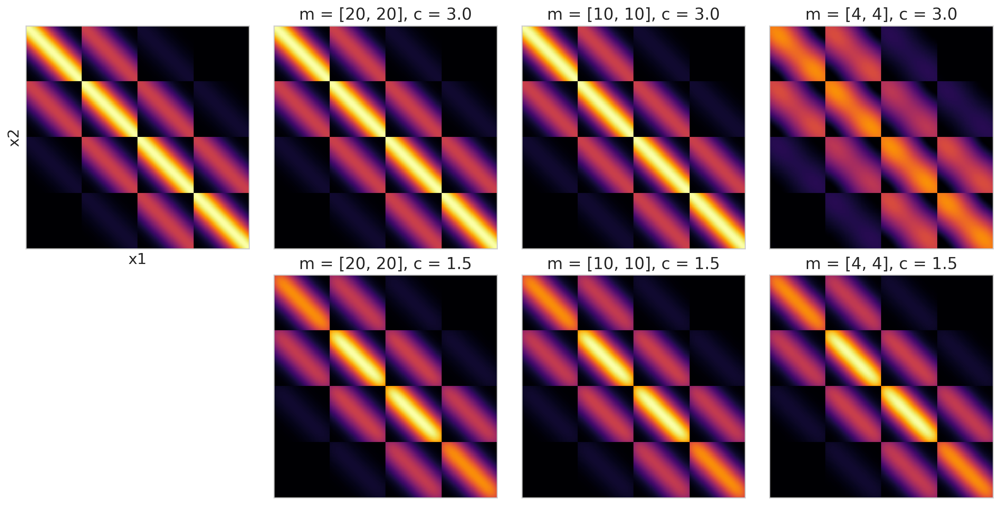

In [13]:
fig, axs = plt.subplots(2, 4, figsize=(14, 7))

axs[0, 0].imshow(K, cmap="inferno", vmin=0, vmax=1)
axs[1, 0].axis("off")
for ax in axs.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
axs[0, 0].set_xlabel("x1")
axs[0, 0].set_ylabel("x2")
im_kwargs = {
    "cmap": "inferno",
    "vmin": 0,
    "vmax": 1,
    "interpolation": "none",
}

## column 1
m, c = [20, 20], 3.0
L = pm.gp.hsgp_approx.set_boundary(Xs, c).eval()
K_approx = calculate_Kapprox(Xs, L, m)
axs[0, 1].imshow(K_approx, **im_kwargs)
axs[0, 1].set_title(f"m = {m}, c = {c}")

m, c = [20, 20], 1.5
L = pm.gp.hsgp_approx.set_boundary(Xs, c).eval()
K_approx = calculate_Kapprox(Xs, L, m)
axs[1, 1].imshow(K_approx, **im_kwargs)
axs[1, 1].set_title(f"m = {m}, c = {c}")

## column 2
m, c = [10, 10], 3.0
L = pm.gp.hsgp_approx.set_boundary(Xs, c).eval()
K_approx = calculate_Kapprox(Xs, L, m)
axs[0, 2].imshow(K_approx, **im_kwargs)
axs[0, 2].set_title(f"m = {m}, c = {c}")

m, c = [10, 10], 1.5
L = pm.gp.hsgp_approx.set_boundary(Xs, c).eval()
K_approx = calculate_Kapprox(Xs, L, m)
axs[1, 2].imshow(K_approx, **im_kwargs)
axs[1, 2].set_title(f"m = {m}, c = {c}")

## column 3
m, c = [4, 4], 3.0
L = pm.gp.hsgp_approx.set_boundary(Xs, c).eval()
K_approx = calculate_Kapprox(Xs, L, m)
axs[0, 3].imshow(K_approx, **im_kwargs)
axs[0, 3].set_title(f"m = {m}, c = {c}")

m, c = [4, 4], 1.5
L = pm.gp.hsgp_approx.set_boundary(Xs, c).eval()
K_approx = calculate_Kapprox(Xs, L, m)
axs[1, 3].imshow(K_approx, **im_kwargs)
axs[1, 3].set_title(f"m = {m}, c = {c}")

plt.tight_layout();

The plots above compare the approximate Gram matrices to the unapproximated Gram matrix in the top left panel.  The goal is to compare the approximated Gram matrices to the true one (upper left).  Qualitatively, the more similar they look the better the approximation.  Also, these results are only relevant to the context of the particular domain defined by `X` and the chosen lengthscale, $\ell = 3$ -- just because it looks good for $\ell = 3$ doesn't mean it will look good for, for instance, $\ell = 10$.  

We can make a few observations:
- The approximation visually looks good for the two panels with $m = [20, 20]$ and $m = [10, 10]$, with $c=3.0$.  The rest show clear differences to the unapproximated Gram matrix.  
- $c=1.5$ is generally too small, regardless of $m$.
- Perhaps surprisingly, the $m=[4, 4]$, $c=1.5$ approximation looks better than the $m=[4, 4]$, $c=3$ one.  As we showed earlier, when we "stretch" the eigenvector basis to fill a larger domain than our `X` (larger by the multiple $c$), we can lose fidelity at smaller lengthscales.  

For your particular situation, you will need to experiment across your range of lengthscales and quantify how much approximation error is acceptable. Often, when prototyping a model, you can use a lower fidelity HSGP approximation for faster sampling.  Then, once you understand the range of relevant lengthscales, you can dial in the correct $m$ and $L$ (or $c$) values.  

Be aware that it's also possible to encounter scenarios where a low fidelity HSGP approximation gives a more parsimonious fit than a high fidelity HSGP approximation.  A low fidelity HSGP approximation is still a valid prior for some unknown function, if somewhat contrived.  Whether that matters will depend on your context.

# Example 2: Working with HSGPs as a parametric, linear model 

One of the main benefits of the HSGP approximation is the ability to integrate it into existing models, especially if you need to do prediction in new x-locations after sampling.  Unlike other GP implementations in PyMC, you can bypass the `.prior` and `.conditional` API, and insead use `HSGP.prior_linearized`, which allows you use `pm.MutableData` and `pm.set_data` for making predictions. 

**Refer to this section if you're interested in:**
1. Seeing a two dimensional, or spatial, HSGP example with other predictors in the model.
2. Using HSGPs for prediction within larger PyMC models.
3. Convert your HSGP approximation into an _HSTP_ approximation, or an approximation to a TP, or Student-t process.

In [14]:
def simulate_2d(
    beta0_true,
    beta1_true,
    ell_true,
    eta_true,
    sigma_true,
):
    # Create the 2d X locations
    from scipy.stats import qmc

    sampler = qmc.Sobol(d=2, scramble=False, optimization="lloyd")
    X = 20 * sampler.random_base2(m=11) - 10.0

    # add the fixed effect at specific intervals
    ix = 1.0 * (np.abs(X[:, 0] // 5) == 1)
    X = np.hstack((X, ix[:, None]))

    # Draw one sample from the underlying GP
    n = X.shape[0]
    cov_func = eta_true**2 * pm.gp.cov.Matern52(3, ell_true, active_dims=[0, 1])
    gp_true = pm.MvNormal.dist(mu=np.zeros(n), cov=cov_func(X))
    f_true = pm.draw(gp_true, draws=1, random_seed=rng)

    # Add the fixed effects
    mu = beta0_true + beta1_true * X[:, 2] + f_true

    # The observed data is the latent function plus a small amount
    # of Gaussian distributed noise.
    noise_dist = pm.Normal.dist(mu=0.0, sigma=sigma_true)
    y_obs = mu + pm.draw(noise_dist, draws=n, random_seed=rng)
    return y_obs, f_true, mu, X


y_obs, f_true, mu, X = simulate_2d(
    beta0_true=3.0,
    beta1_true=2.0,
    ell_true=1.0,
    eta_true=1.0,
    sigma_true=0.75,
)

# Split into train and test sets
ix_tr = (X[:, 1] < 2) | (X[:, 1] > 4)
ix_te = (X[:, 1] > 2) & (X[:, 1] < 4)

X_tr, X_te = X[ix_tr, :], X[ix_te, :]
y_tr, y_te = y_obs[ix_tr], y_obs[ix_te]

/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_1656/2813859405.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=0.02)


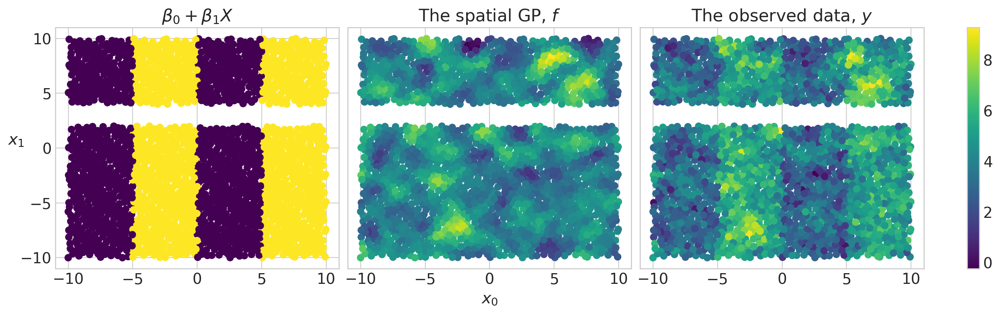

In [15]:
fig = plt.figure(figsize=(13, 4))
plt.subplots_adjust(wspace=0.02)

ax1 = plt.subplot(131)
ax1.scatter(X_tr[:, 0], X_tr[:, 1], c=mu[ix_tr] - f_true[ix_tr])
ax1.set_title("$\\beta_0 + \\beta_1 X$")
ax1.set_ylabel("$x_1$", rotation=0)

ax2 = plt.subplot(132)
ax2.scatter(X_tr[:, 0], X_tr[:, 1], c=f_true[ix_tr])
ax2.set_title("The spatial GP, $f$")
ax2.set_yticks([])
ax2.set_xlabel("$x_0$")

ax3 = plt.subplot(133)
im = ax3.scatter(X_tr[:, 0], X_tr[:, 1], c=y_obs[ix_tr])
ax3.set_title("The observed data, $y$")
ax3.set_yticks([])

fig.colorbar(im, ax=[ax1, ax2, ax3]);

In [16]:
with pm.Model() as model:
    # Set mutable data
    X_gp = pm.MutableData("X_gp", X_tr[:, :2])
    X_fe = pm.MutableData("X_fe", X_tr[:, 2])

    # Priors on regression coefficients
    beta0 = pm.Normal("beta0", mu=0.0, sigma=10.0)
    beta1 = pm.Normal("beta1", mu=0.0, sigma=10.0)

    # Prior on the HSGP
    eta = pm.Exponential("eta", scale=3.0)
    ell_params = pm.find_constrained_prior(
        pm.Lognormal, lower=0.5, upper=5.0, mass=0.9, init_guess={"mu": 1.0, "sigma": 1.0}
    )
    ell = pm.Lognormal("ell", **ell_params)
    cov_func = eta**2 * pm.gp.cov.Matern52(input_dim=2, ls=ell)

    # m and c control the fidelity of the approximation
    m0, m1, c = 30, 30, 2.5
    gp = pm.gp.HSGP(m=[m0, m1], c=c, cov_func=cov_func)

    X_mu = np.mean(X_tr[:, :2], axis=0)
    Xs = X_gp - X_mu
    phi, sqrt_psd = gp.prior_linearized(Xs=Xs)

    beta = pm.Normal("beta", size=gp._m_star)
    f = pm.Deterministic("f", phi @ (beta * sqrt_psd))

    mu = pm.Deterministic("mu", beta0 + beta1 * X_fe + f)

    sigma = pm.Exponential("sigma", scale=3.0)
    pm.Normal("y_obs", mu=mu, sigma=sigma, observed=y_tr, shape=X_gp.shape[0])

Before sampling and looking at results, there are a few things to pay attention to in the model above.  

#### Setting the coefficients, centered and non-centered

First, `prior_linearized` returns the eigenvector basis, `phi`, and the square root of the power spectrum at the eigenvalues, `sqrt_psd`.  You have to construct the HSGP approximation from these.  The following are the relevant lines of code, showing both the centered and non-centered parameterization.
```python
phi, sqrt_psd = gp.prior_linearized(Xs=Xs)

## non-centered
beta = pm.Normal("beta", size=gp._m_star)
f = pm.Deterministic("f", phi @ (beta * sqrt_psd)) 

## centered
beta = pm.Normal("beta", sigma=sqrt_psd, size=gp._m_star)
f = pm.Deterministic("f", phi @ beta) 
```
Be sure to set the size of `beta` using the `m_star` attribute of the HSGP object (or the number of columns of `phi`), $m^* = \prod_i m_i$.  In the above example, $m^* = 30 \cdot 30 = 900$, and is the total number of basis vectors used in the approximation.   

#### Scaling the input `X`

The input `X` _must_ be centered, and the same mean that was calculated from the training `X` must be used to subtract from test points.  The relevant lines of code are:
```python
X_ = pm.MutableData("X", X_tr)

X_mu = np.mean(X_tr, axis=0)
Xs = X_ - X_mu
phi, sqrt_psd = gp.prior_linearized(Xs=Xs)
```
Notice that the mutable data is initialized with the training points, `X_tr`, and `X_mu` is calculated using the numpy array `X_tr`, not the mutable symbolic variable `X_`.

#### Approximating a TP instead of a GP

We can slightly modify the code above to obtain a Student-t process,
```python
nu = pm.Gamma("nu", alpha=2, beta=0.1)
beta = pm.StudentT("beta", nu=nu, size=gp._m_star)
f = pm.Deterministic("f", phi @ (beta * sqrt_psd)) 
```
where we use a $\text{Gamma}(\alpha=2, \beta=0.1)$ prior, which places around 50% probability that $\nu > 30$, the point where a Student-T roughly becomes indistinguishable from a Gaussian.

### Results

Next, let's sample the model and quickly check the results.

In [17]:
with model:
    idata = pm.sample(nuts_sampler="numpyro")

Compiling...
Compilation time = 0:00:01.759675
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time = 0:01:37.375379
Transforming variables...
Transformation time = 0:00:00.881021


In [18]:
az.summary(idata, var_names=["beta0", "beta1", "eta", "ell", "sigma"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta0,3.140,0.107,2.946,3.355,0.002,0.001,3896.0,2266.0,1.0
beta1,2.122,0.112,1.906,2.328,0.002,0.001,5562.0,2966.0,1.0
eta,1.204,0.206,0.910,1.556,0.006,0.004,1340.0,1429.0,1.0
ell,0.652,0.152,0.351,0.923,0.004,0.003,1453.0,1542.0,1.0
sigma,0.849,0.015,0.821,0.877,0.000,0.000,5693.0,2784.0,1.0


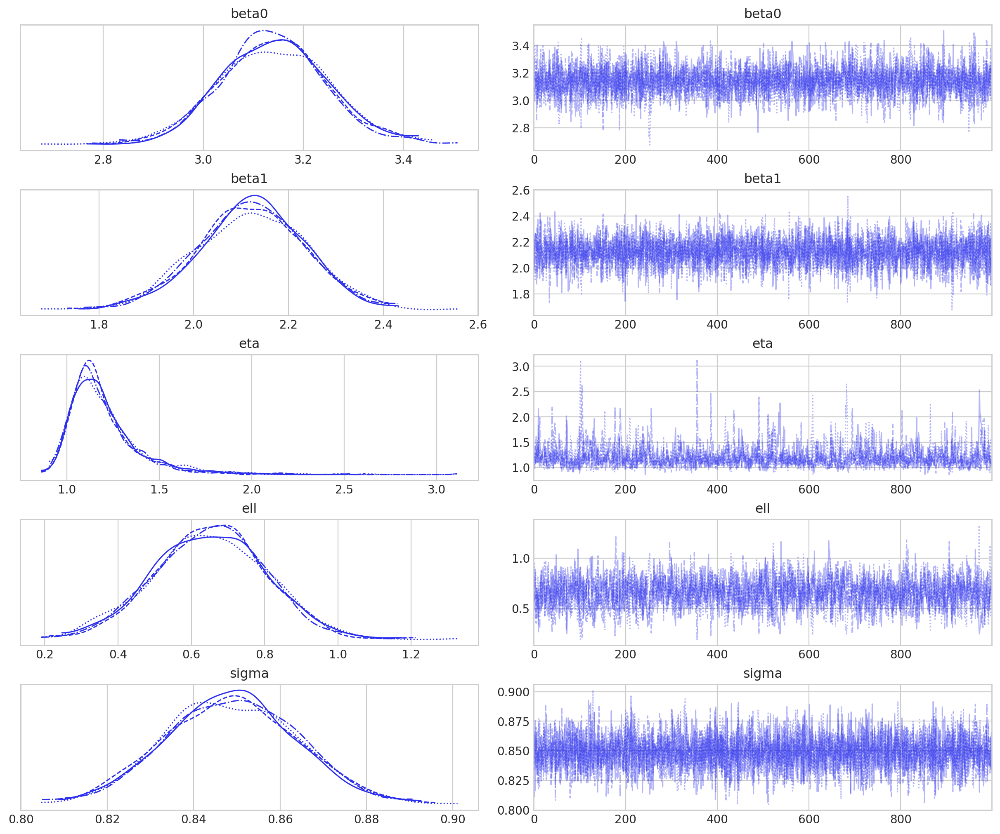

In [19]:
az.plot_trace(idata, var_names=["beta0", "beta1", "eta", "ell", "sigma"]);

Then, all we need to do to make predictions at new points is use `pm.set_data`.  We'll show the fit and the predictions together in the plot below.

In [20]:
with model:
    pm.set_data({"X_gp": X[:, :2]})
    pm.set_data({"X_fe": X[:, 2]})

    idata_thinned = idata.sel(draw=slice(None, None, 10))
    idata.extend(pm.sample_posterior_predictive(idata_thinned, var_names=["mu", "f"]))

Sampling: []


/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_1656/2193475777.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=0.02)


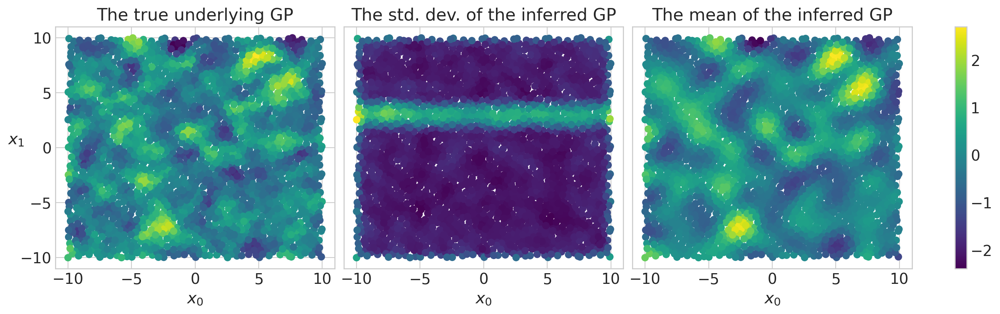

In [21]:
fig = plt.figure(figsize=(13, 4))
plt.subplots_adjust(wspace=0.02)

ax1 = plt.subplot(131)
ax1.scatter(X[:, 0], X[:, 1], c=f_true)
ax1.set_title("The true underlying GP")
ax1.set_xlabel("$x_0$")
ax1.set_ylabel("$x_1$", rotation=0)

ax2 = plt.subplot(132)
f_sd = az.extract(idata.posterior_predictive, var_names="f").std(dim="sample")
ax2.scatter(X[:, 0], X[:, 1], c=f_sd)
ax2.set_title("The std. dev. of the inferred GP")
ax2.set_yticks([])
ax2.set_xlabel("$x_0$")

ax3 = plt.subplot(133)
f_mu = az.extract(idata.posterior_predictive, var_names="f").mean(dim="sample")
im = ax3.scatter(X[:, 0], X[:, 1], c=f_mu)
ax3.set_title("The mean of the inferred GP")
ax3.set_yticks([])
ax3.set_xlabel("$x_0$")

fig.colorbar(im, ax=[ax1, ax2, ax3]);

Sampling diagnostics all look good, and we can see that the underlying GP was inferred nicely.  We can also see the increase in uncertainty outside of our training data as a horizontal stripe in the middle panel, showing the increased standard deviation of the inferred GP here. 

# Example 3: A hierarchical HSGP, a more custom model

The `HSGP` class and associated functions are also meant to be clear and hackable to enable building more complicated models.  In the following example we fit a hierarchical HSGP, where each of the individual GPs (indexed by $i$) can have different lengthscales.  The model is:

$$
\begin{align}
f^\mu &\sim \mathcal{GP}\left(0 \,, K^\mu(x, x' \,; \eta^\mu, \ell^\mu) \right) \\
f_i &\sim \mathcal{GP}\left(f^\mu \,, K^\delta(x, x' \,; \eta^\delta, \ell^\delta_i) \right) \\
\end{align}
$$

There are two scale parameters $\eta^\mu$ and $\eta^\delta$.  $\eta^\mu$ controls the overall scaling of the group GP, and $\eta^\delta$ controls the strength of the partial pooling of the $f_i$ to $f^\mu$.  Each of the $i$ GPs can have its own lengthscale $\ell^\delta_i$.  In the example below we simulate additive Gaussian noise, but this HSGP model will of course work with any likelihood anywhere within your model.

**Refer to this section if you're interested in:**
1. Seeing an example of a fast approximation to a Hierarchical GP.
2. Seeing how to construct more advanced and custom GP models.
3. Using HSGPs for prediction within larger PyMC models.

## Simulate data

Simulate a one-dimensional GP observed at 300 locations (200 used for training, the remaining 100 for testing)

In [4]:
# Generate wider range data
x_full = np.linspace(0, 15, 300)

# Split into training and test sets
n_train = 200
x_train = x_full[:n_train]
x_test = x_full[n_train:]

# Definfe the mean GP
eta_mu_true = 1.0
ell_mu_true = 1.5
cov_mu = eta_mu_true**2 * pm.gp.cov.Matern52(input_dim=1, ls=ell_mu_true)

# Define the delta GPs
n_gps = 10
eta_delta_true = 0.5
ell_delta_true = pm.draw(pm.Lognormal.dist(mu=np.log(ell_mu_true), sigma=0.5), draws=n_gps)

cov_deltas = [
    eta_delta_true**2 * pm.gp.cov.Matern52(input_dim=1, ls=ell_i) for ell_i in ell_delta_true
]

# Additive gaussian noise
sigma_noise = 0.5
noise_dist = pm.Normal.dist(mu=0.0, sigma=sigma_noise)

In [5]:
def generate_gp_samples(x, cov_mu, cov_deltas, noise_dist, rng):
    """
    Generate samples from a hierarchical Gaussian Process (GP).
    """
    n = len(x)
    # One draw from the mean GP
    f_mu_true = pm.draw(pm.MvNormal.dist(mu=np.zeros(n), cov=cov_mu(x[:, None])))

    # Draws from the delta GPs
    f_deltas = []
    for cov_delta in cov_deltas:
        f_deltas.append(pm.draw(pm.MvNormal.dist(mu=np.zeros(n), cov=cov_delta(x[:, None]))))
    f_delta = np.vstack(f_deltas)

    # The hierarchical GP
    f_true = f_mu_true[:, None] + f_delta.T

    # Observed values with noise
    n_gps = len(cov_deltas)
    y_obs = f_true + pm.draw(noise_dist, draws=n * n_gps, random_seed=rng).reshape(n, n_gps)

    return f_mu_true, f_true, y_obs

In [6]:
# Generate samples for the full data
f_mu_true_full, f_true_full, y_full = generate_gp_samples(
    x_full, cov_mu, cov_deltas, noise_dist, rng
)

f_mu_true_train = f_mu_true_full[:n_train]
f_mu_true_test = f_mu_true_full[n_train:]

f_true_train = f_true_full[:n_train]
f_true_test = f_true_full[n_train:]

y_train = y_full[:n_train]
y_test = y_full[n_train:]

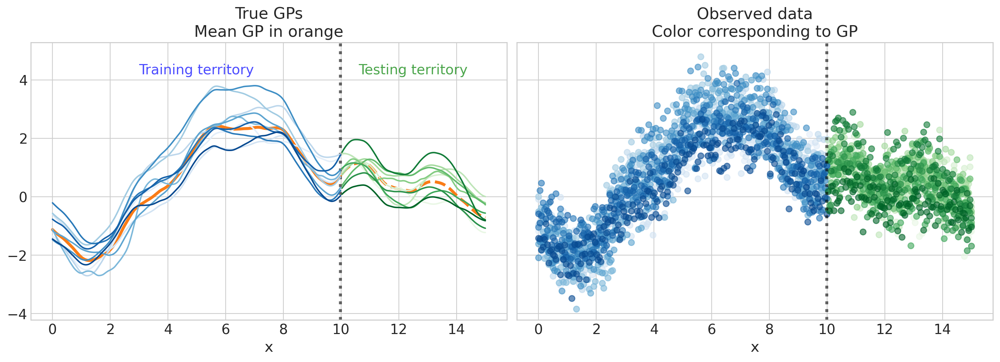

In [7]:
fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)
colors_train = plt.cm.Blues(np.linspace(0.1, 0.9, n_gps))
colors_test = plt.cm.Greens(np.linspace(0.1, 0.9, n_gps))
ylims = [1.1 * np.min(y_full), 1.1 * np.max(y_full)]

axs[0].plot(x_train, f_mu_true_train, color="C1", lw=3)
axs[0].plot(x_test, f_mu_true_test, color="C1", lw=3, ls="--")
axs[0].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)
axs[1].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)

# Positioning text for "Training territory" and "Testing territory"
train_text_x = (x_train[0] + x_train[-1]) / 2
test_text_x = (x_train[-1] + x_test[-1]) / 2
text_y = ylims[0] + (ylims[1] - ylims[0]) * 0.9

# Adding text to the left plot
axs[0].text(
    train_text_x,
    text_y,
    "Training territory",
    horizontalalignment="center",
    verticalalignment="center",
    fontsize=14,
    color="blue",
    alpha=0.7,
)
axs[0].text(
    test_text_x,
    text_y,
    "Testing territory",
    horizontalalignment="center",
    verticalalignment="center",
    fontsize=14,
    color="green",
    alpha=0.7,
)

for i in range(n_gps):
    axs[0].plot(x_train, f_true_train[:, i], color=colors_train[i])
    axs[0].plot(x_test, f_true_test[:, i], color=colors_test[i])
    axs[1].scatter(x_train, y_train[:, i], color=colors_train[i], alpha=0.6)
    axs[1].scatter(x_test, y_test[:, i], color=colors_test[i], alpha=0.6)

axs[0].set(xlabel="x", ylim=ylims, title="True GPs\nMean GP in orange")
axs[1].set(xlabel="x", ylim=ylims, title="Observed data\nColor corresponding to GP");

## Build the model

To build this model to allow different lengthscales per GP, we need to rewrite the power spectral density.  The one attached to the PyMC covariance classes, i.e. `pm.gp.cov.Matern52.power_spectral_density`, is vectorized over the input dimension -- but we need one vectorized across GPs.

Fortunately this one at least wasn't too hard to adapt. It's shown below.

In [8]:
def matern52_psd(omega, ls):
    """
    Calculate the power spectral density for the Matern52 covariance kernel.

    Inputs:
      - omega: The frequencies where the power spectral density is evaluated
      - ls: The lengthscales. Can be a scalar or a vector.
    """
    num = 2.0 * np.sqrt(np.pi) * pt.gamma(3.0) * pt.power(5.0, 5.0 / 2.0)
    den = 0.75 * pt.sqrt(np.pi)
    return (num / den) * ls * pt.power(5.0 + pt.outer(pt.square(omega), pt.square(ls)), -3.0)

Next, we build a function that constructs the hierarchical GP.  Notice that it assumes some names for the `dims`, but our goal is to provide a simple foundation that you can adapt to your specific use-case.  You can see that this is a bit more deconstructed than `.prior_linearized`.

In [9]:
def hierarchical_HSGP(Xs, m, c, eta_mu, ell_mu, eta_delta, ell_delta):
    L = pm.gp.hsgp_approx.set_boundary(Xs, c)
    eigvals = pm.gp.hsgp_approx.calc_eigenvalues(L, m, tl=pt)
    phi = pm.Deterministic("phi", pm.gp.hsgp_approx.calc_eigenvectors(Xs, L, eigvals, m, tl=pt))
    omega = pt.sqrt(eigvals)

    # calculate f_mu, the mean of the hierarchical gp
    beta = pm.Normal("f_mu_coeffs", mu=0.0, sigma=1.0, dims="m_ix")
    psd = matern52_psd(omega, ell_mu).flatten()
    f_mu = pm.Deterministic("f_mu", phi @ (beta * pt.sqrt(psd) * eta_mu))

    # calculate f_delta, the gp offsets
    beta = pm.Normal("f_delta_coeffs", mu=0.0, sigma=1.0, dims=("m_ix", "gp_ix"))
    psd = matern52_psd(omega, ell_delta)
    f_delta = pm.Deterministic("f_delta", phi @ (beta * pt.sqrt(psd) * eta_delta))

    # calculate total gp
    return pm.Deterministic("f", f_mu[:, None] + f_delta)

Next, we use the heuristics to choose `m` and `c`, 

In [10]:
m, c, _ = approx_params(
    x_lower=np.min(x_full),
    x_upper=np.max(x_full) * 2,
    ell_lower=0.2,
    ell_upper=2.0,
    cov_func="matern52",
)

print(f"m: {m}, c: {c:.2f}")

m: 238, c: 1.20


In [20]:
coords = {
    "gp_ix": np.arange(n_gps),
    "m_ix": np.arange(m),
}

with pm.Model(coords=coords) as model:
    # handle mean subtraction correctly
    x_mu = np.mean(x_train)
    X_ = pm.Data("X", x_train[:, None])
    Xs = X_ - x_mu

    ## Prior for the mean process
    eta_mu = pm.Exponential("eta_mu", scale=1.0)
    ell_mu_params = pm.find_constrained_prior(
        pm.Lognormal, lower=0.5, upper=2.5, mass=0.95, init_guess={"mu": 1.0, "sigma": 1.0}
    )
    log_ell_mu = pm.Normal("log_ell_mu", **ell_mu_params)
    ell_mu = pm.Deterministic("ell_mu", pt.exp(log_ell_mu))

    ## Prior for the offsets
    eta_delta = pm.Exponential("eta_delta", scale=1.0)
    log_ell_delta_z = pm.Normal("log_ell_delta_z", dims="gp_ix")
    log_ell_delta_sd = pm.Exponential("log_ell_delta_sd", scale=1.0)
    log_ell_delta = log_ell_mu + log_ell_delta_sd * log_ell_delta_z
    ell_delta = pm.Deterministic("ell_delta", pt.exp(log_ell_delta), dims="gp_ix")

    f = hierarchical_HSGP(Xs, [m], c, eta_mu, ell_mu, eta_delta, ell_delta)
    sigma = pm.Exponential("sigma", scale=3)
    pm.Normal("y", mu=f, sigma=sigma, observed=y_train, shape=(X_.shape[0], n_gps))

## Prior predictive checks

Now, what do these priors mean? Good question. As always, it's crucial to do **prior predictive checks**, especially for GPs, where amplitudes and lenghtscales can be very hard to infer:

In [21]:
with model:
    idata = pm.sample_prior_predictive()

Sampling: [eta_delta, eta_mu, f_delta_coeffs, f_mu_coeffs, log_ell_delta_sd, log_ell_delta_z, log_ell_mu, sigma, y]


In [22]:
def plot_gps(idata, f_mu_true, f_true, group="posterior", return_f=False):
    """
    Plot the underlying hierarchical GP and inferred GPs with posterior intervals.

    Parameters:
    - idata: InferenceData object containing the posterior samples.
    - f_mu_true: The true mean function values.
    - f_true: The true function values for each group.
    - group: Whether to plot the prior or posterior predictive samples. Default posterior.
    """
    if group == "predictions":
        x = idata.predictions_constant_data.X.squeeze().to_numpy()
    else:
        x = idata.constant_data.X.squeeze().to_numpy()
    y_obs = idata.observed_data["y"].to_numpy()
    n_gps = f_true.shape[1]

    # Extract mean and standard deviation for 'f_mu' and 'f' from the posterior
    f_mu_post = az.extract(idata, group=group, var_names="f_mu")
    f_mu_mu = f_mu_post.mean(dim="sample")
    f_mu_sd = f_mu_post.std(dim="sample")

    f_post = az.extract(idata, group=group, var_names="f")
    f_mu = f_post.mean(dim="sample")
    f_sd = f_post.std(dim="sample")

    # Plot settings
    fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)
    colors = plt.cm.Set1(np.linspace(0.1, 0.9, n_gps))
    ylims = [1.1 * np.min(y_obs), 1.1 * np.max(y_obs)]

    # Plot true underlying GP
    axs[0].plot(x, f_mu_true, color="k", lw=3)
    for i in range(n_gps):
        axs[0].plot(x, f_true[:, i], color=colors[i], alpha=0.7)

    # Plot inferred GPs with uncertainty
    for i in range(n_gps):
        axs[1].fill_between(
            x,
            f_mu[:, i] - f_sd[:, i],
            f_mu[:, i] + f_sd[:, i],
            color=colors[i],
            alpha=0.3,
            edgecolor="none",
        )
    # Plot mean GP
    axs[1].fill_between(
        x,
        f_mu_mu - f_mu_sd,
        f_mu_mu + f_mu_sd,
        color="k",
        alpha=0.6,
        edgecolor="none",
    )

    # Set labels and titles
    for ax in axs:
        ax.set_xlabel("x")
        ax.set_ylabel("y")
    axs[0].set(ylim=ylims, title="True GPs for the 10 time-series\nMean GP in black")
    axs[1].set(ylim=ylims, title=r"Inferred GPs, $\pm 1 \sigma$ posterior intervals")

    if return_f:
        return f_mu_mu, f_mu_sd, f_mu, f_sd

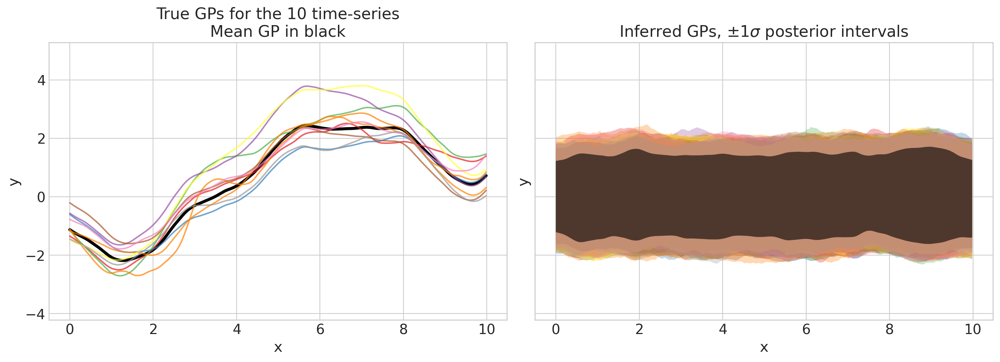

In [23]:
plot_gps(idata, f_mu_true_train, f_true_train, group="prior");

Once we're satisfied with our priors, which is the case here, we can... sample the model!

## Sampling & Convergence checks

In [24]:
with model:
    idata.extend(pm.sample(nuts_sampler="numpyro"))

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [25]:
idata.sample_stats.diverging.sum().data

array(0)

In [26]:
az.summary(idata, var_names=["eta_mu", "ell_mu", "eta_delta", "ell_delta", "sigma"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
eta_mu,1.144,0.232,0.752,1.571,0.008,0.005,965.0,1512.0,1.01
ell_mu,1.522,0.169,1.219,1.852,0.005,0.004,1068.0,1885.0,1.00
eta_delta,0.521,0.059,0.417,0.632,0.002,0.001,943.0,1662.0,1.00
ell_delta[0],1.551,0.354,0.896,2.223,0.009,0.006,1552.0,2312.0,1.00
ell_delta[1],2.183,0.639,1.168,3.397,0.021,0.015,988.0,1727.0,1.00
ell_delta[2],1.534,0.331,0.900,2.134,0.008,0.006,1789.0,2303.0,1.00
ell_delta[3],1.847,0.551,0.979,2.851,0.018,0.013,1213.0,1257.0,1.00
ell_delta[4],1.054,0.302,0.552,1.615,0.013,0.009,586.0,1241.0,1.01
ell_delta[5],1.436,0.351,0.804,2.116,0.009,0.007,1347.0,2369.0,1.00
ell_delta[6],2.214,0.580,1.213,3.252,0.017,0.012,1136.0,2013.0,1.00


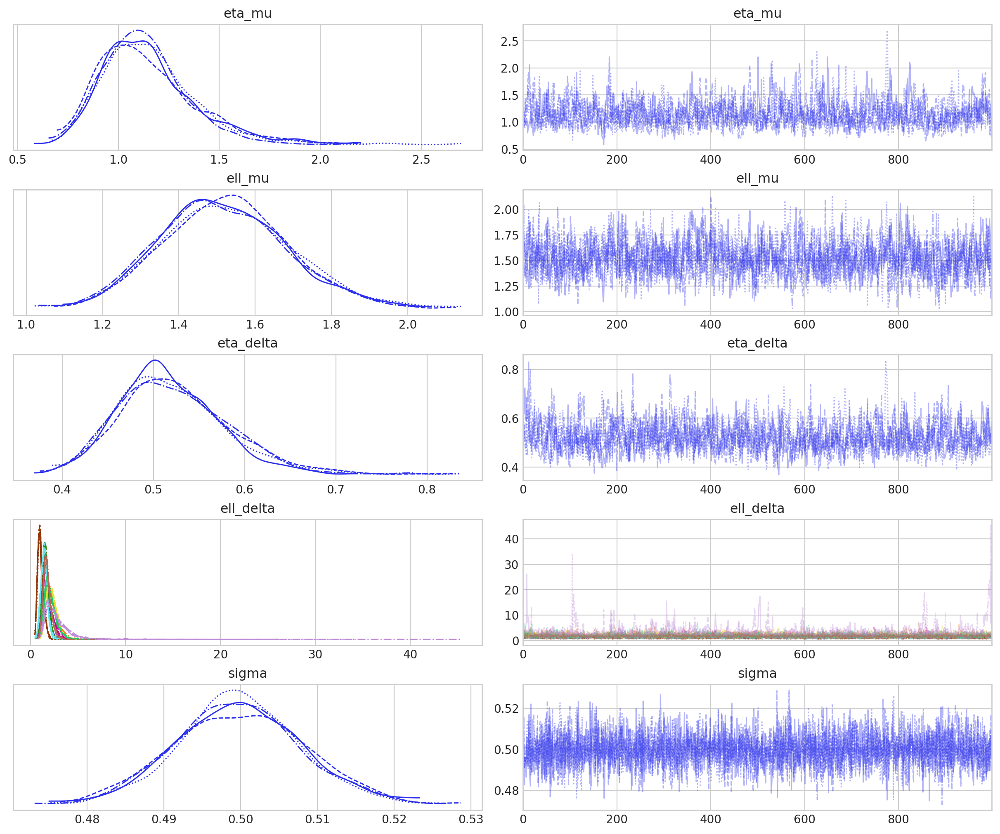

In [27]:
az.plot_trace(idata, var_names=["eta_mu", "ell_mu", "eta_delta", "ell_delta", "sigma"]);

## Posterior checks

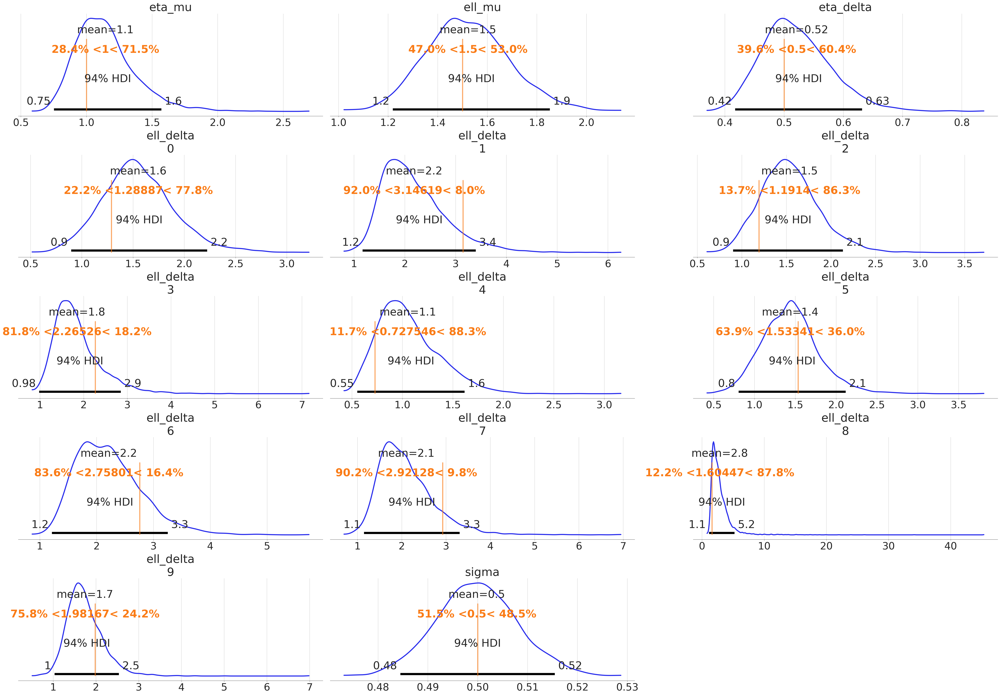

In [28]:
az.plot_posterior(
    idata,
    var_names=["eta_mu", "ell_mu", "eta_delta", "ell_delta", "sigma"],
    ref_val={
        "eta_mu": [{"ref_val": eta_mu_true}],
        "ell_mu": [{"ref_val": ell_mu_true}],
        "eta_delta": [{"ref_val": eta_delta_true}],
        "ell_delta": [{"gp_ix": i, "ref_val": ell_delta_true[i]} for i in range(n_gps)],
        "sigma": [{"ref_val": sigma_noise}],
    },
    grid=(5, 3),
    textsize=30,
);

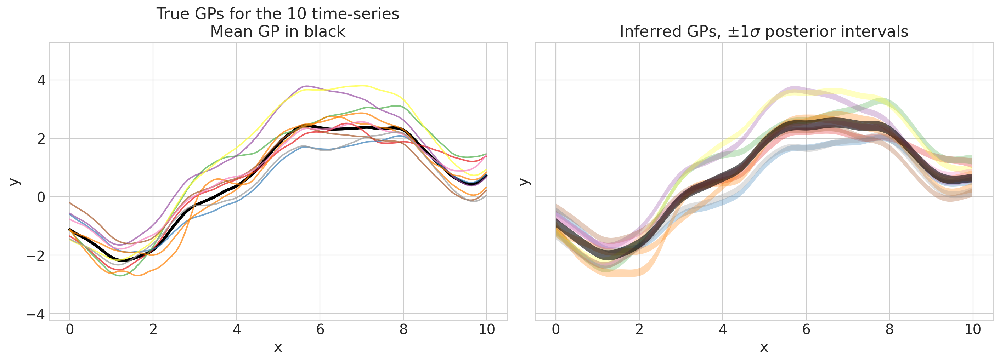

In [29]:
plot_gps(idata, f_mu_true_train, f_true_train);

That looks great! Now we can go ahead and predict out of sample.

## Prediction

In [30]:
with model:
    pm.set_data({"X": x_full[:, None]})

    idata.extend(
        pm.sample_posterior_predictive(idata, var_names=["f_mu", "f"], predictions=True),
    )

Sampling: []


Output()

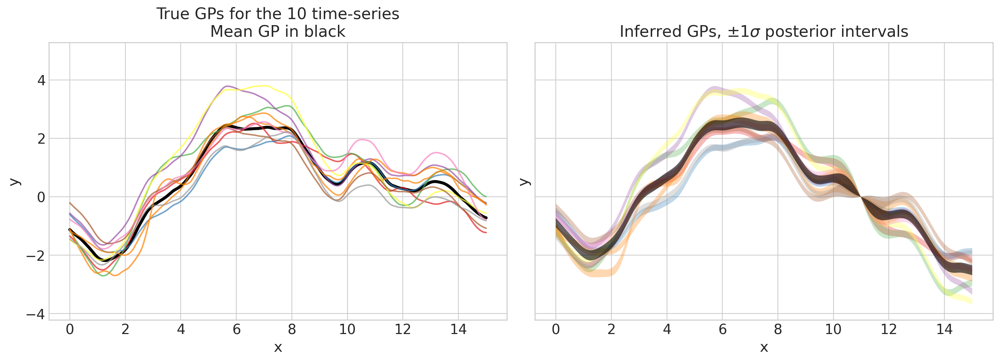

In [31]:
pred_f_mu_mu, pred_f_mu_sd, pred_f_mu, pred_f_sd = plot_gps(
    idata, f_mu_true_full, f_true_full, group="predictions", return_f=True
)

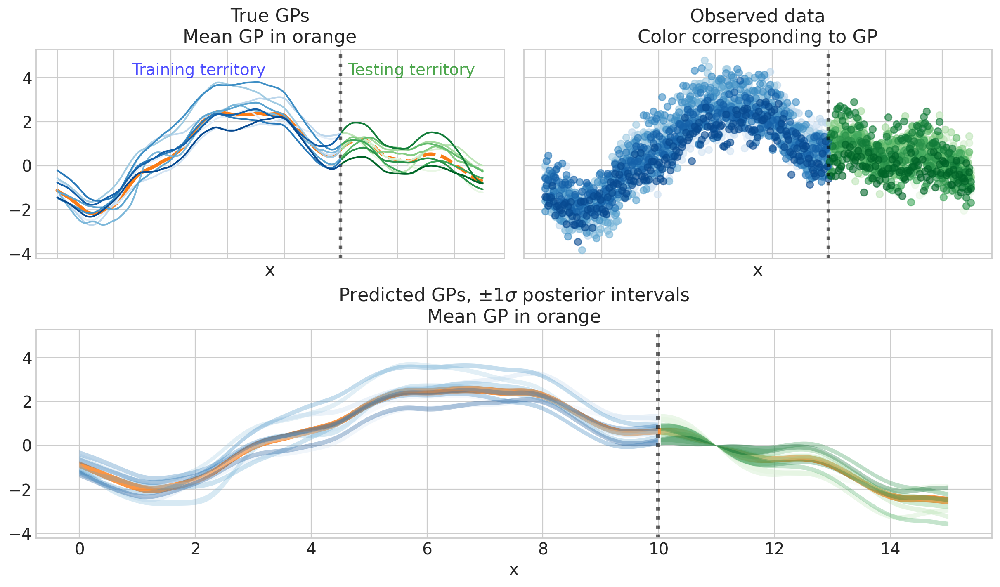

In [32]:
fig, axs = plt.subplot_mosaic(
    [["True", "Data"], ["Preds", "Preds"]],
    layout="constrained",
    sharex=True,
    sharey=True,
    figsize=(12, 7),
)

axs["True"].plot(x_train, f_mu_true_train, color="C1", lw=3)
axs["True"].plot(x_test, f_mu_true_test, color="C1", lw=3, ls="--")
axs["True"].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)
axs["True"].text(
    train_text_x,
    text_y,
    "Training territory",
    horizontalalignment="center",
    verticalalignment="center",
    fontsize=14,
    color="blue",
    alpha=0.7,
)
axs["True"].text(
    test_text_x,
    text_y,
    "Testing territory",
    horizontalalignment="center",
    verticalalignment="center",
    fontsize=14,
    color="green",
    alpha=0.7,
)

axs["Data"].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)
axs["Preds"].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)

# Plot mean GP
axs["Preds"].fill_between(
    x_full,
    pred_f_mu_mu - pred_f_mu_sd,
    pred_f_mu_mu + pred_f_mu_sd,
    color="C1",
    alpha=0.8,
    edgecolor="none",
)

for i in range(n_gps):
    axs["True"].plot(x_train, f_true_train[:, i], color=colors_train[i])
    axs["True"].plot(x_test, f_true_test[:, i], color=colors_test[i])
    axs["Data"].scatter(x_train, y_train[:, i], color=colors_train[i], alpha=0.6)
    axs["Data"].scatter(x_test, y_test[:, i], color=colors_test[i], alpha=0.6)
    # Plot inferred GPs with uncertainty
    axs["Preds"].fill_between(
        x_train,
        pred_f_mu[:n_train, i] - pred_f_sd[:n_train, i],
        pred_f_mu[:n_train, i] + pred_f_sd[:n_train, i],
        color=colors_train[i],
        alpha=0.3,
        edgecolor="none",
    )
    axs["Preds"].fill_between(
        x_test,
        pred_f_mu[n_train:, i] - pred_f_sd[n_train:, i],
        pred_f_mu[n_train:, i] + pred_f_sd[n_train:, i],
        color=colors_test[i],
        alpha=0.3,
        edgecolor="none",
    )

axs["True"].set(xlabel="x", ylim=ylims, title="True GPs\nMean GP in orange")
axs["Data"].set(xlabel="x", ylim=ylims, title="Observed data\nColor corresponding to GP")
axs["Preds"].set(
    xlabel="x",
    ylim=ylims,
    title="Predicted GPs, $\\pm 1 \\sigma$ posterior intervals\nMean GP in orange",
);

# Example 4: An HSGP that exploits Kronecker structure

This example is a multiple GP model like the previous, but it assumes a different relationship between the GPs.  Instead of pooling towards a common mean GP, there is an additional covariance structure that specifies their relationship.  For example, we may have time series measurements of temperature from multiple weather stations.  The similarity over time should mostly depend only on the distance between the weather stations.  They all will likely have the same dynamics, or same covariance structure, over time.  You can think of this as _local_ partial pooling.  

In the example below, we arrange the GPs along a single "spatial" axis, so it's a 1D problem and not 2D, and then allow them to share the same time covariance.  This might be clearer after taking a look at the simulated data below.  

Mathematically, this model uses the [Kronecker product](GP-Kron.myst.md), where the "space" and "time" dimensions are _separable_.
$$
K = K_{x} \otimes K_{t}
$$
If there are $n_t$ time points and $n_x$ GPs, then the resulting $K$ matrix will have dimension $n_x \cdot n_t \times n_x \cdot n_t$.  Using a regular GP, this would be $\mathcal{O}(n_t^3 n_x^3)$.  So, we can achieve a pretty massive speed-up by both taking advantage of Kronecker structure and using the HSGP approximation.  It isn't required that both of the dimensions (in this example, space or time) use the HSGP approximation.  It's possible to use either a vanilla GP or inducing points for the "spatial" covariance, and the HSGP approximation in time.  In the example below, both use the HSGP approximation.

**Refer to this section if you're interested in:**
1. Seeing an example of exploiting Kronecker structure and the HSGP approximation.
2. Seeing how to construct more advanced and custom GP models.

## Data generation

In [243]:
n_gps, n_t = 30, 100
t = np.linspace(0, 10, n_t)
x = np.linspace(-5, 5, n_gps)

eta_true = 1.0
ell_x_true = 2.0
cov_x = eta_true**2 * pm.gp.cov.Matern52(input_dim=1, ls=ell_x_true)
Kx = cov_x(x[:, None])

ell_t_true = 2.0
cov_t = pm.gp.cov.Matern52(input_dim=1, ls=ell_t_true)
Kt = cov_t(t[:, None])

K = pt.slinalg.kron(Kx, Kt)
f_true = pm.draw(pm.MvNormal.dist(mu=np.zeros(n_gps * n_t), cov=K)).reshape(n_gps, n_t).T

# Additive gaussian noise
sigma_noise = 0.5
noise_dist = pm.Normal.dist(mu=0.0, sigma=sigma_noise)
y_obs = f_true + pm.draw(noise_dist, draws=n_t * n_gps, random_seed=rng).reshape(n_t, n_gps)

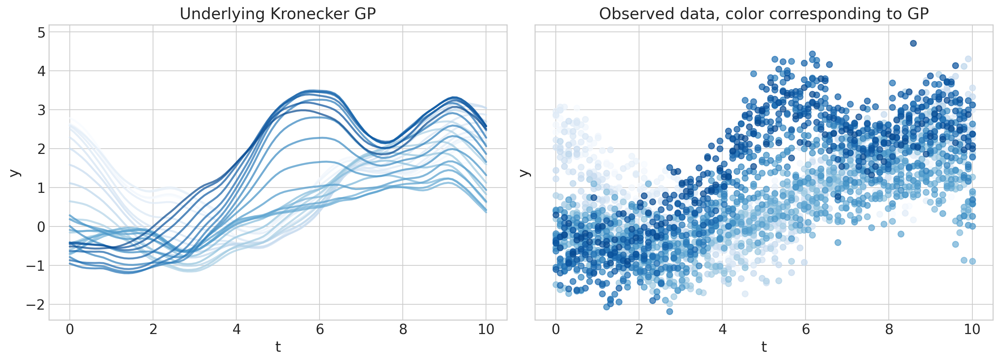

In [258]:
fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)
colors = plt.cm.Blues(np.linspace(0.0, 0.9, n_gps))
ylims = [1.1 * np.min(y_obs), 1.1 * np.max(y_obs)]

for i in range(n_gps):
    axs[0].plot(t, f_true[:, i], color=colors[i], lw=2, alpha=0.7)
    axs[1].scatter(t, y_obs[:, i], color=colors[i], alpha=0.7)

for ax in axs:
    ax.set_xlabel("t")
    ax.set_ylabel("y")
axs[0].set(ylim=ylims, title="Underlying Kronecker GP")
axs[1].set(ylim=ylims, title="Observed data, color corresponding to GP");

## Kronecker GP specification

In [245]:
def kronecker_HSGP(Xs, m, c, cov_t, cov_x):
    Xs_t, Xs_x = Xs
    m_t, m_x = m
    c_t, c_x = c

    L_t = pm.gp.hsgp_approx.set_boundary(Xs_t, c_t)
    eigvals_t = pm.gp.hsgp_approx.calc_eigenvalues(L_t, [m_t], tl=pt)
    phi_t = pm.gp.hsgp_approx.calc_eigenvectors(Xs_t, L_t, eigvals_t, [m_t], tl=pt)
    omega_t = pt.sqrt(eigvals_t)

    sqrt_psd_t = pt.sqrt(cov_t.power_spectral_density(omega_t))
    chol_t = phi_t * sqrt_psd_t

    L_x = pm.gp.hsgp_approx.set_boundary(Xs_x, c_x)
    eigvals_x = pm.gp.hsgp_approx.calc_eigenvalues(L_x, [m_x], tl=pt)
    phi_x = pm.gp.hsgp_approx.calc_eigenvectors(Xs_x, L_x, eigvals_x, [m_x], tl=pt)
    omega_x = pt.sqrt(eigvals_x)

    sqrt_psd_x = pt.sqrt(cov_x.power_spectral_density(omega_x))
    chol_x = phi_x * sqrt_psd_x

    z = pm.Normal("beta", size=m_x * m_t)
    return (chol_x @ (chol_t @ pt.reshape(z, (m_t, m_x))).T).T

## PyMC Model

Next, we use the heuristics to choose `m` and `c`:

In [246]:
m_t, c_t, _ = approx_params(
    x_lower=np.min(t), x_upper=np.max(t), ell_lower=1.0, ell_upper=3.0, cov_func="matern52"
)
m_x, c_x, _ = approx_params(
    x_lower=np.min(x), x_upper=np.max(x), ell_lower=1.0, ell_upper=3.0, cov_func="matern52"
)

print(f"m_t: {m_t}, c_t: {c_t:.2f}")
print(f"m_x: {m_x}, c_x: {c_x:.2f}")

m_t: 32, c_t: 2.46
m_x: 32, c_x: 2.46


In [247]:
with pm.Model() as model:
    # handle mean subtraction correctly
    xt_mu = np.mean(t)
    Xt_ = pm.MutableData("Xt", t[:, None])
    Xs_t = Xt_ - xt_mu

    xx_mu = np.mean(x)
    Xx_ = pm.MutableData("Xx", x[:, None])
    Xs_x = Xx_ - xx_mu

    ell_t_params = pm.find_constrained_prior(
        pm.Lognormal, lower=0.2, upper=2.0, mass=0.95, init_guess={"mu": 1.0, "sigma": 1.0}
    )
    ell_t = pm.Lognormal("ell_t", **ell_t_params)
    cov_t = pm.gp.cov.Matern52(1, ls=ell_t)

    ell_x_params = pm.find_constrained_prior(
        pm.Lognormal, lower=0.2, upper=2.0, mass=0.95, init_guess={"mu": 1.0, "sigma": 1.0}
    )
    ell_x = pm.Lognormal("ell_x", **ell_x_params)
    cov_x = pm.gp.cov.Matern52(1, ls=ell_x)

    eta = pm.Exponential("eta", scale=1.0)
    Xs, m, c = [Xs_t, Xs_x], [m_t, m_x], [c_t, c_x]
    f = kronecker_HSGP(Xs, m, c, cov_t, cov_x)
    f = pm.Deterministic("f", eta * f)

    sigma = pm.Exponential("sigma", scale=3)
    pm.Normal("y", mu=f, sigma=sigma, observed=y_obs)

## Prior predictive checks

In [248]:
with model:
    idata = pm.sample_prior_predictive()

Sampling: [beta, ell_t, ell_x, eta, sigma, y]


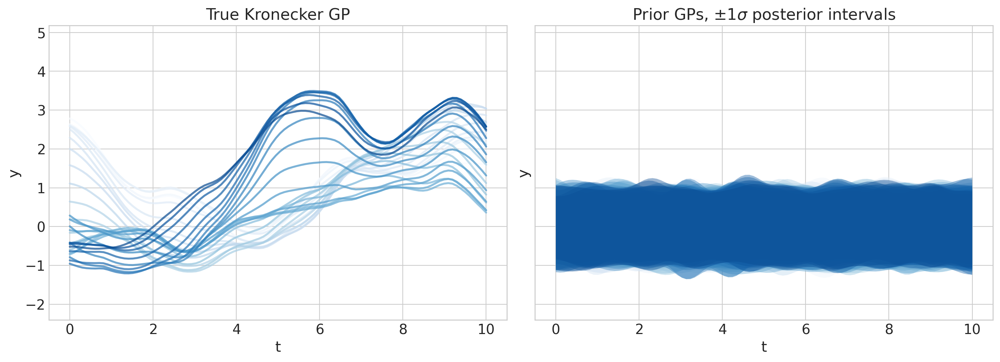

In [257]:
f_mu = az.extract(idata, group="prior", var_names="f").mean(dim="sample")
f_sd = az.extract(idata, group="prior", var_names="f").std(dim="sample")

fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)
colors = plt.cm.Blues(np.linspace(0.0, 0.9, n_gps))
ylims = [1.1 * np.min(y_obs), 1.1 * np.max(y_obs)]

for i in range(n_gps):
    axs[0].plot(t, f_true[:, i], color=colors[i], lw=2, alpha=0.7)
    axs[1].fill_between(
        t,
        f_mu[:, i] - f_sd[:, i],
        f_mu[:, i] + f_sd[:, i],
        color=colors[i],
        alpha=0.4,
        edgecolor="none",
    )

for ax in axs:
    ax.set_xlabel("t")
    ax.set_ylabel("y")

axs[0].set(ylim=ylims, title="True Kronecker GP")
axs[1].set(ylim=ylims, title=r"Prior GPs, $\pm 1 \sigma$ posterior intervals");

## Sampling & Convergence checks

In [250]:
with model:
    idata.extend(pm.sample(nuts_sampler="numpyro"))

Compiling...
Compilation time = 0:00:01.425701
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time = 0:00:24.785646
Transforming variables...
Transformation time = 0:00:00.388862


In [259]:
idata.sample_stats.diverging.sum().data

array(0)

In [251]:
az.summary(idata, var_names=["eta", "ell_x", "ell_t", "sigma"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
eta,0.860,0.066,0.742,0.986,0.001,0.001,2674.0,2733.0,1.0
ell_x,1.657,0.133,1.412,1.902,0.003,0.002,1899.0,2791.0,1.0
ell_t,1.472,0.134,1.206,1.709,0.004,0.002,1439.0,2412.0,1.0
sigma,0.495,0.006,0.482,0.507,0.000,0.000,8258.0,2878.0,1.0


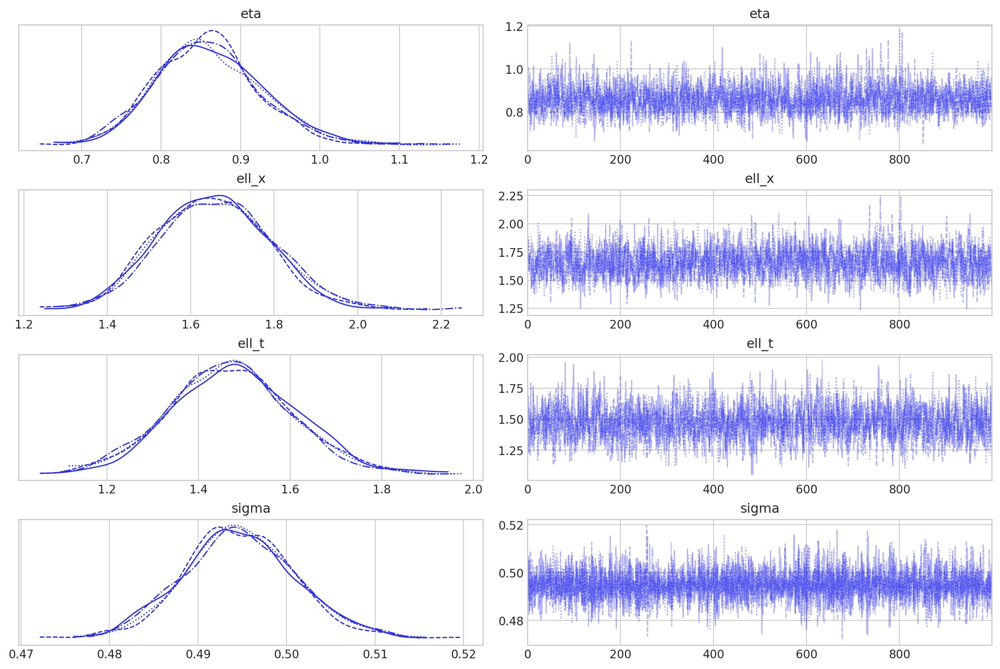

In [252]:
az.plot_trace(idata, var_names=["eta", "ell_x", "ell_t", "sigma"]);

## Posterior predictive checks

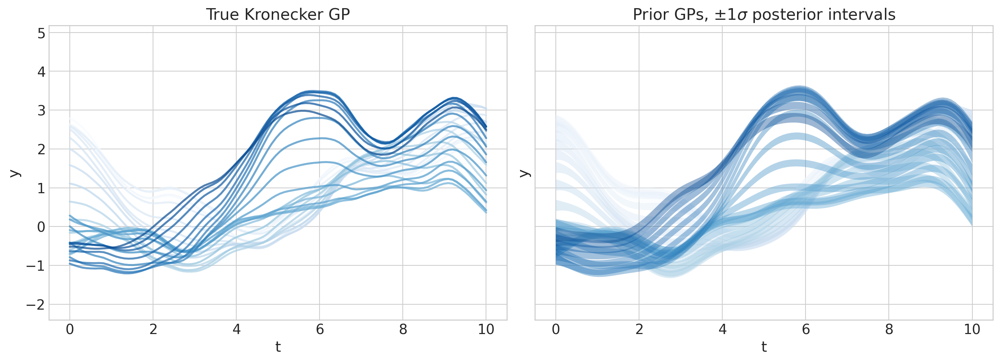

In [255]:
f_mu = az.extract(idata, group="posterior", var_names="f").mean(dim="sample")
f_sd = az.extract(idata, group="posterior", var_names="f").std(dim="sample")

fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)
colors = plt.cm.Blues(np.linspace(0.0, 0.9, n_gps))
ylims = [1.1 * np.min(y_obs), 1.1 * np.max(y_obs)]

for i in range(n_gps):
    axs[0].plot(t, f_true[:, i], color=colors[i], lw=2, alpha=0.7)
    axs[1].fill_between(
        t,
        f_mu[:, i] - f_sd[:, i],
        f_mu[:, i] + f_sd[:, i],
        color=colors[i],
        alpha=0.4,
        edgecolor="none",
    )

for ax in axs:
    ax.set_xlabel("t")
    ax.set_ylabel("y")

axs[0].set(ylim=ylims, title="True Kronecker GP")
axs[1].set(ylim=ylims, title=r"Prior GPs, $\pm 1 \sigma$ posterior intervals");

## Authors

* Created by [Bill Engels](https://github.com/bwengals) in 2024 ([pymc-examples#647](https://github.com/pymc-devs/pymc-examples/pull/647))

## Watermark

In [256]:
%load_ext watermark
%watermark -n -u -v -iv -w -p xarray

Last updated: Fri Apr 05 2024

Python implementation: CPython
Python version       : 3.11.4
IPython version      : 8.14.0

xarray: 2024.2.0

matplotlib: 3.7.2
arviz     : 0.16.1
pytensor  : 2.19.0
numpy     : 1.24.4
pymc      : 5.12.0

Watermark: 2.4.3



:::{include} ../page_footer.md
:::